In [1]:
import main

In [2]:
# import argparse
# parser = argparse.ArgumentParser()

# # Model configuration.
# parser.add_argument('--lambda_cd', type=float, default=1, help='weight for hidden code loss')
# parser.add_argument('--dim_neck', type=int, default=16)
# parser.add_argument('--dim_emb', type=int, default=256)
# parser.add_argument('--dim_pre', type=int, default=512)
# parser.add_argument('--freq', type=int, default=16)

# # Training configuration.
# parser.add_argument('--data_dir', type=str, default='./spmel')
# parser.add_argument('--batch_size', type=int, default=2, help='mini-batch size')
# parser.add_argument('--num_iters', type=int, default=1000000, help='number of total iterations')
# parser.add_argument('--len_crop', type=int, default=128, help='dataloader output sequence length')

# # Miscellaneous.
# parser.add_argument('--log_step', type=int, default=10)

# config = {}
# args = parser.parse_args()
# config = {key: parser.get_default(key) for key in vars(args)}
# print(config)

config = {
            'lambda_cd': 1, 
            'dim_neck': 16, 
            'dim_emb': 256, 
            'dim_pre': 512, 
            'freq': 16, 
            'data_dir': './sp', 
            'batch_size': 2, 
            'num_iters': 1000000, 
            'len_crop': 128, 
            'log_step': 10
        }

In [3]:
from data_loader import get_loader
vcc_loader = get_loader(config.data_dir, config.batch_size, config.len_crop)

AttributeError: 'dict' object has no attribute 'data_dir'

In [4]:
from data_loader import get_loader
vcc_loader = get_loader('./spmel', 1, 128)

Finished loading the dataset...


In [5]:
next(iter(vcc_loader))[0][0].shape

torch.Size([128, 80])

In [6]:
import pandas as pd
pd.DataFrame(next(iter(vcc_loader)))

/home/vkalbag/miniconda3/lib/python3.9/site-packages/pandas/core/internals/construction.py:576: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  values = np.array([convert(v) for v in values])
/home/vkalbag/miniconda3/lib/python3.9/site-packages/pandas/core/internals/construction.py:576: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  values = np.array([convert(v) for v 

,0
0,"[[[tensor(0.7438), tensor(0.8802), tensor(0.77..."
1,"[[tensor(0.0734), tensor(-0.0262), tensor(0.04..."


In [ ]:
from solver_encoder import Solver
Solver()

In [8]:
import make_spect

ModuleNotFoundError: No module named 'make_spect'

In [1]:
from scipy.signal import get_window
from librosa.filters import mel
from scipy import signal

def psnr_np(pred, target, target_top=True, top=1e4):
    """
    Peak Signal-to-Noise Ratio (but not really) - NumPy version
    Since spectrograms values are unbounded, this function uses `max(target)` as the maximum possible value by default.
    """
    if target_top:
        top = target.max()
    return 20 * np.log10(top / np.sqrt(((pred - target) ** 2).mean()))

def pySTFT(x, fft_length=2048, hop_length=1024):
    
    x = np.pad(x, int(fft_length//2), mode='reflect')
    
    noverlap = fft_length - hop_length
    shape = x.shape[:-1]+((x.shape[-1]-noverlap)//hop_length, fft_length)
    strides = x.strides[:-1]+(hop_length*x.strides[-1], x.strides[-1])
    result = np.lib.stride_tricks.as_strided(x, shape=shape,
                                             strides=strides)
    
    fft_window = get_window('hann', fft_length, fftbins=True)
    result = np.fft.rfft(fft_window * result, n=fft_length).T
    
    return np.abs(result) 

def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

In [2]:
import librosa
import numpy as np
x,fs = librosa.load('./input_data/gaoxiaosong/gaoxiaosong_1.wav', mono=True, sr = 44100)

In [3]:
D = pySTFT(x).T
mel_basis = mel(sr = 16000, n_fft = 2048, fmin=90, fmax=7600, n_mels=80).T
min_level = np.exp(-100 / 20 * np.log(10))
b, a = butter_highpass(30, 16000, order=5)

# Convert to mel and normalize
D_mel = np.dot(D, mel_basis)
D_db = 20 * np.log10(np.maximum(min_level, D_mel)) - 16
S = np.clip((D_db + 100) / 100, 0, 1)    

In [4]:
D.shape

(185, 1025)

In [5]:
S.shape

(185, 80)

In [7]:
# melinv = librosa.feature.inverse.mel_to_stft(S.T, sr = 44100, n_fft=2048, power=5)
# D_t = D.T

In [10]:
from matplotlib import pyplot as plt

In [9]:
def expect_near(a,b, thresh=0.1):
    if abs(a-b) < thresh:
        pass
    else:
        print("Not near")

In [10]:
for i in range(S.shape[0]):
    temp = np.zeros([1025])
    arr = S[i,:]
    k=0
    for j in range(1025):
        if j%13 == 0:
            temp[j] = arr[k]
            k=k+1
        else:
            pass
        pass
    pass

In [11]:
idx

NameError: name 'idx' is not defined

In [12]:
for i in range(S.shape[0]):
    temp = np.zeros([1025])
    arr = S[i,:]
    k=0
    for j in range(1025):
        if j%13 == 0:
            temp[j] = arr[k]
            k=k+1
        else:
            pass
        pass
    pass

In [13]:
x = temp[:27]

In [14]:
np.where(S[0]!=0)[0].shape

(53,)

In [15]:
i=13
if i in np.where(x!=0)[0]:
    print("true")

true


In [7]:
for i in range(S.shape[0]):
    temp = np.zeros([1025])
    arr = S[i,:]
    k=0
    for j in range(1025):
        if j%13 == 0:
            temp[j] = arr[k]
            k=k+1
        else:
            pass
        pass
    break


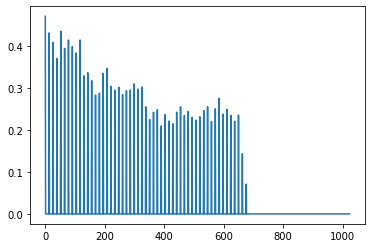

In [31]:
plt.plot(temp)

### WORKING LOOP

In [18]:
temp.shape

(1025,)

In [8]:
# TODO: ADD LOGIC FOR LOOPING OVER EVERY FRAME

    out=np.zeros([1025])
    for i in range(temp.shape[0]):
        # print(x)
        if i in (np.where(temp!=0)[0]):
            # print(i)
            start = i
            end = i+14
        # print(start, end)
        tmp = temp[start:end]
        initial = tmp[0]
        final = tmp[-1]
        # print(f"final: {final}, initial: {initial}")
        # for j in range(tmp.shape[0]):
        # print(i)
        # print(i%14)
        if i <= 54*13:
            # print(f"interpolating for {i}")
            out[i] = initial + (final-initial)*((i%14)/13)
            # print(temp[i])
        else:
            out[i] = 0

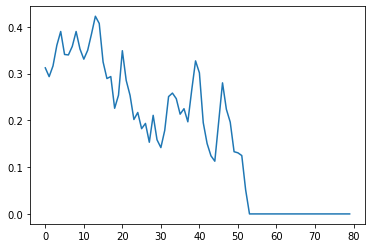

In [11]:
plt.plot(S[0])

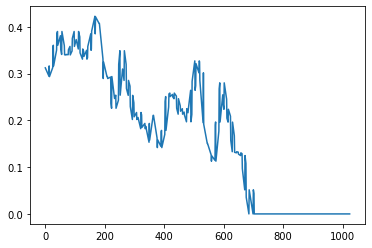

In [12]:
plt.plot(out[:])

In [17]:
out.shape

(1025,)

In [16]:
import librosa
plt.plot(librosa.feature.inverse.mel_to_stft(out,sr=44100, n_fft=2048))

IndexError: tuple index out of range

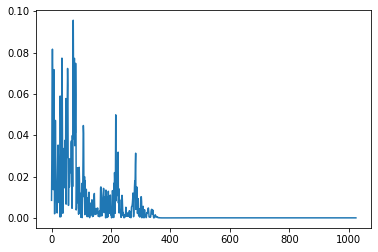

In [13]:
plt.plot(D[0])

In [24]:
S[0]

array([0.31207369, 0.29330952, 0.31618317, 0.36033303, 0.38974189,
       0.34065459, 0.33968681, 0.3578433 , 0.38975923, 0.35238246,
       0.3306582 , 0.34957026, 0.38473207, 0.42233439, 0.40688344,
       0.32472624, 0.28924642, 0.29348738, 0.22572405, 0.25365166,
       0.34871338, 0.28523076, 0.25331922, 0.20172695, 0.2167157 ,
       0.18214167, 0.19332326, 0.15313331, 0.21061511, 0.15838674,
       0.1416859 , 0.17841664, 0.25068677, 0.25814266, 0.24620027,
       0.21310147, 0.22479622, 0.19679742, 0.26411255, 0.32692898,
       0.30143963, 0.19488085, 0.15032783, 0.12415618, 0.11262037,
       0.19640794, 0.28001984, 0.22355195, 0.19613952, 0.13290781,
       0.13052948, 0.1246843 , 0.05147663, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

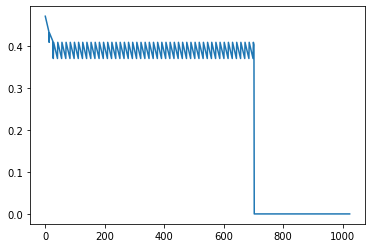

In [32]:
plt.plot(out)

In [115]:
final

0.4309986056915936

In [138]:
temp

array([0.470653, 0.      , 0.      , ..., 0.      , 0.      , 0.      ])

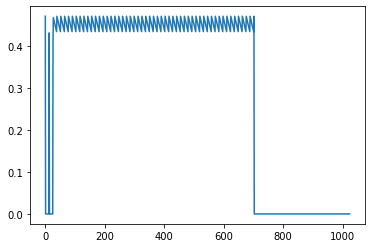

In [139]:
plt.plot(temp)

In [84]:
# y=temp
# # y = np.array([1,2,0,4,0,5,0,0,11])
# x = np.arange(len(y))
# idx = np.where(y!=0)        #or np.nonzero(y) -- thanks DanielF
f = interp1d(np.linspace(0,1024),S[i,:])
ynew = f(x)

print()
print('after')
print(ynew)

ValueError: x and y arrays must be equal in length along interpolation axis.

In [44]:
y = S[0]
xnew = np.arange(len(y))
zero_idx = np.where(y==0)
xold = np.delete(xnew,zero_idx)
yold = np.delete(y, zero_idx)

print('before')
print(xold)
print(yold)

f = interp1d(xold,yold)

ynew = f(xnew)
print()
print('after')
print(xnew)
print(ynew)

before
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52]
[0.31207369 0.29330952 0.31618317 0.36033303 0.38974189 0.34065459
 0.33968681 0.3578433  0.38975923 0.35238246 0.3306582  0.34957026
 0.38473207 0.42233439 0.40688344 0.32472624 0.28924642 0.29348738
 0.22572405 0.25365166 0.34871338 0.28523076 0.25331922 0.20172695
 0.2167157  0.18214167 0.19332326 0.15313331 0.21061511 0.15838674
 0.1416859  0.17841664 0.25068677 0.25814266 0.24620027 0.21310147
 0.22479622 0.19679742 0.26411255 0.32692898 0.30143963 0.19488085
 0.15032783 0.12415618 0.11262037 0.19640794 0.28001984 0.22355195
 0.19613952 0.13290781 0.13052948 0.1246843  0.05147663]


ValueError: A value in x_new is above the interpolation range.

In [24]:
from scipy.interpolate import interp1d


In [36]:
from torch.utils import data
import torch
import numpy as np
import pickle 
import os  
import pyworld  
import pandas as pd
       
from multiprocessing import Process, Manager   


class SpeechVocalDataset(data.Dataset):
    """Dataset class for the SpeechVocalDataset dataset."""
    def __init__(self, root_dir, len_crop):
        """Initialize and preprocess the SpeechVocalDataset dataset."""
        lookup_path = root_dir + '/input_file_list.csv'
        self.root_dir = root_dir
        self.len_crop = len_crop
        self.step = 10
        self.lookup = pd.read_csv(lookup_path, header=0)
        self.lookup = self.lookup.sample(42) # randomly shuffle the dataset
        self.dataset = pd.read_pickle('./processed_data/pyworld/train.pkl')
        self.dataset = self.dataset.sample(42) # randomly shuffle the dataset
        # self.train_dataset = list(dataset)
        self.num_tokens = len(self.lookup)
        print('Finished loading the dataset...')
        
    def load_data(self, dataset, i):
        return dataset.iloc[i][3], dataset.iloc[i][5]
        
    def __getitem__(self, index):
        dataset = self.dataset#lookup
        sp_tmp,emb = self.load_data(dataset,index)
        if sp_tmp.shape[0] < self.len_crop:
            len_pad = self.len_crop - tmp.shape[0]
            sp = np.pad(sp_tmp, ((0,len_pad),(0,0)), 'constant')
        elif sp_tmp.shape[0] > self.len_crop:
            left = np.random.randint(sp_tmp.shape[0]-self.len_crop)
            sp = sp_tmp[left:left+self.len_crop, :]
        else:
            sp = sp_tmp

        return sp,emb
    def __len__(self):
        """Return the number of spkrs."""
        return self.num_tokens
    
    
    

def get_loader(root_dir, batch_size=16, len_crop=128, num_workers=0):
    """Build and return a data loader."""
    
    dataset = SpeechVocalDataset(root_dir, len_crop)
    
    worker_init_fn = lambda x: np.random.seed((torch.initial_seed()) % (2**32))
    data_loader = data.DataLoader(dataset=dataset,
                                  batch_size=batch_size,
                                  shuffle=True,
                                  num_workers=num_workers,
                                  drop_last=True,
                                  worker_init_fn=worker_init_fn)
    return data_loader

In [37]:
dataloader = get_loader('./input_data')

Finished loading the dataset...


In [12]:
import pandas as pd
import librosa
import pyworld
import numpy as np

from torch.utils import data
import torch
import numpy as np
import pickle 
import os  
import pyworld  
import pandas as pd

from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from multiprocessing import Process, Manager   


class SpeechVocalDataset(data.Dataset):
    """Dataset class for the SpeechVocalDataset dataset."""
    def __init__(self, root_dir, len_crop):
        """Initialize and preprocess the SpeechVocalDataset dataset."""
        lookup_path = root_dir + '/../input_data/input_file_list.csv'
        self.root_dir = root_dir
        self.len_crop = len_crop
        self.step = 10
        self.lookup = pd.read_csv(lookup_path, header=0)
        self.lookup = self.lookup.sample(frac=1) # randomly shuffle the dataset
        self.dataset = pd.read_pickle(f'{self.root_dir}/pyworld/train.pkl')
        self.dataset = self.dataset.sample(frac=1) # randomly shuffle the dataset
        # self.train_dataset = list(dataset)
        self.num_tokens = len(self.lookup)
        print('Finished loading the dataset...')
        
    def load_data(self, dataset, i):
        return dataset.iloc[i][3], dataset.iloc[i][5]
        
    def __getitem__(self, index):
        dataset = self.dataset#lookup
        sp_tmp,emb = self.load_data(dataset,index)
        if sp_tmp.shape[0] < self.len_crop:
            len_pad = self.len_crop - sp_tmp.shape[0]
            sp = np.pad(sp_tmp, ((0,len_pad),(0,0)), 'constant')
        elif sp_tmp.shape[0] > self.len_crop:
            left = np.random.randint(sp_tmp.shape[0]-self.len_crop)
            sp = sp_tmp[left:left+self.len_crop, :]
        else:
            sp = sp_tmp

        return sp,emb
    def __len__(self):
        """Return the number of spkrs."""
        return self.num_tokens
    
def train_val_dataset(dataset, val_split=0.25):
    train_idx, val_idx = train_test_split(list(range(len(dataset))), test_size=val_split)
    datasets = {}
    datasets['train'] = Subset(dataset, train_idx)
    datasets['val'] = Subset(dataset, val_idx)
    return datasets
    
def get_loader(root_dir, batch_size=16, len_crop=128, num_workers=0):
    """Build and return a data loader."""
    
    dataset = SpeechVocalDataset(root_dir, len_crop)
    datasets = train_val_dataset(dataset, val_split=0.25)
    dataloaders = {x:DataLoader(datasets[x],32, shuffle=True, num_workers=4, drop_last=True) for x in ['train','val']}
    worker_init_fn = lambda x: np.random.seed((torch.initial_seed()) % (2**32))
    # train_loader = data.DataLoader(dataset=dataloaders['train'],
    #                               batch_size=batch_size,
    #                               shuffle=True,
    #                               num_workers=num_workers,
    #                               drop_last=True,
    #                               worker_init_fn=worker_init_fn)

    # valid_loader = data.DataLoader(dataset=dataloaders['val'],
    #                               batch_size=len(dataloaders['val'].dataset),
    #                               shuffle=True,
    #                               num_workers=num_workers,
    #                               drop_last=True,
    #                               worker_init_fn=worker_init_fn)
    train_loader = dataloaders['train']
    valid_loader = dataloaders['val']
    return train_loader, valid_loader

In [9]:
# train_loader, valid_set = get_loader('./processed_data',16,128,0)
dataset = SpeechVocalDataset('./processed_data', 128)
datasets = train_val_dataset(dataset, val_split=0.25)
dataloaders = {x:DataLoader(datasets[x],32, shuffle=True, num_workers=4, drop_last=True) for x in ['train','val']}

Finished loading the dataset...


In [13]:
next(iter(dataloaders['train']))

IndexError: Caught IndexError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/torch/utils/data/_utils/worker.py", line 287, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 49, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/torch/utils/data/_utils/fetch.py", line 49, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/torch/utils/data/dataset.py", line 363, in __getitem__
    return self.dataset[self.indices[idx]]
  File "/tmp/ipykernel_247227/2297288386.py", line 41, in __getitem__
    sp_tmp,emb = self.load_data(dataset,index)
  File "/tmp/ipykernel_247227/2297288386.py", line 37, in load_data
    return dataset.iloc[i][3], dataset.iloc[i][5]
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/pandas/core/indexing.py", line 967, in __getitem__
    return self._getitem_axis(maybe_callable, axis=axis)
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/pandas/core/indexing.py", line 1520, in _getitem_axis
    self._validate_integer(key, axis)
  File "/home/vkalbag/miniconda3/lib/python3.9/site-packages/pandas/core/indexing.py", line 1452, in _validate_integer
    raise IndexError("single positional indexer is out-of-bounds")
IndexError: single positional indexer is out-of-bounds


In [18]:
datasets['train']

In [19]:
root_dir = './processed_data'
df = pd.read_pickle(f'{root_dir}/pyworld/train.pkl')

In [21]:
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

train, other = train_test_split(shuffle(df), test_size=0.3)
test, valid = train_test_split(other, test_size=0.5)

In [23]:
train.to_pickle('./processed_data/train.pkl')
test.to_pickle('./processed_data/test.pkl')
valid.to_pickle('./processed_data/valid.pkl')

In [1]:
import pandas as pd
import librosa
import pyworld
import numpy as np

from torch.utils import data
import torch
import numpy as np
import pickle 
import os  
import pyworld  
import pandas as pd

from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from multiprocessing import Process, Manager   


class SpeechVocalDataset(data.Dataset):
    """Dataset class for the SpeechVocalDataset dataset."""
    def __init__(self, root_dir, len_crop, dataset='train'):
        """Initialize and preprocess the SpeechVocalDataset dataset."""
        lookup_path = root_dir + '/../input_data/input_file_list.csv'
        self.root_dir = root_dir
        self.len_crop = len_crop
        self.step = 10
        self.lookup = pd.read_csv(lookup_path, header=0)
        self.lookup = self.lookup.sample(frac=1) # randomly shuffle the dataset
        if dataset == 'train':
            self.dataset = pd.read_pickle(f'{self.root_dir}/train.pkl')
        if dataset == 'valid':
            self.dataset = pd.read_pickle(f'{self.root_dir}/valid.pkl')
        # self.valid_dataset = pd.read_pickle(f'{self.root_dir}/valid.pkl')
        # self.dataset = self.dataset.sample(frac=1) # randomly shuffle the dataset
        # self.train_dataset = list(dataset)
        self.num_tokens = len(self.lookup)
        print('Finished loading the dataset...')
        
    def load_data(self, dataset, i):
        return dataset.iloc[i][3], dataset.iloc[i][5]
        
    def __getitem__(self, index):
        dataset = self.dataset#lookup
        sp_tmp,emb = self.load_data(dataset,index)
        if sp_tmp.shape[0] < self.len_crop:
            len_pad = self.len_crop - sp_tmp.shape[0]
            sp = np.pad(sp_tmp, ((0,len_pad),(0,0)), 'constant')
        elif sp_tmp.shape[0] > self.len_crop:
            left = np.random.randint(sp_tmp.shape[0]-self.len_crop)
            sp = sp_tmp[left:left+self.len_crop, :]
        else:
            sp = sp_tmp

        return sp,emb
    def __len__(self):
        """Return the number of spkrs."""
        return self.num_tokens
    
    
def get_loader(root_dir, batch_size=16, len_crop=128, num_workers=0):
    """Build and return a data loader."""
    
    train_dataset = SpeechVocalDataset(root_dir, len_crop, 'train')
    valid_dataset = SpeechVocalDataset(root_dir, len_crop, 'valid')
    # datasets = train_val_dataset(dataset, val_split=0.25)
    worker_init_fn = lambda x: np.random.seed((torch.initial_seed()) % (2**32))
    train_loader = data.DataLoader(dataset=train_dataset,
                                  batch_size=batch_size,
                                  shuffle=True,
                                  num_workers=num_workers,
                                  drop_last=True,
                                  worker_init_fn=worker_init_fn)

    valid_loader = data.DataLoader(dataset=valid_dataset,
                                  batch_size=len(valid_dataset),
                                  shuffle=True,
                                  num_workers=num_workers,
                                  drop_last=True,
                                  worker_init_fn=worker_init_fn)
    return train_loader, valid_loader


In [2]:
train_loader,valid_loader = get_loader('./processed_data')

Finished loading the dataset...
Finished loading the dataset...


In [4]:
df = pd.read_pickle('./processed_data/train.pkl')

In [8]:
df.iloc[0][5]

array([-7.42120482e-03, -9.13588796e-03, -3.98188643e-02,  3.28509621e-02,
        2.05981266e-03, -1.87513046e-02, -1.31128421e-02, -3.57359946e-02,
       -1.04173318e-01,  1.56078069e-03,  1.56858880e-02,  8.83827545e-03,
        3.61926444e-02,  4.33831662e-03,  1.44867152e-02, -6.04686551e-02,
       -7.42127094e-03,  5.32414243e-02,  7.66699538e-02, -5.12390630e-03,
        5.84988743e-02, -5.33582503e-03,  7.82198797e-04,  2.91901343e-02,
       -1.54203642e-02, -2.50489525e-02,  3.80487256e-02, -8.63645785e-03,
        6.48098513e-02, -7.64255412e-03, -1.03190774e-02, -6.70251697e-02,
        7.38793705e-03,  1.90736223e-02,  5.89638278e-02, -2.19894629e-02,
       -1.00048827e-02, -2.87530962e-02, -1.87489931e-02, -8.64906050e-03,
        6.18358590e-02, -3.22332196e-02,  2.84889936e-02, -3.33315209e-02,
       -1.11617055e-02,  1.25096456e-04,  2.22745766e-05,  5.82387932e-02,
        1.51532926e-02,  1.38829676e-02, -4.24058846e-04, -1.11958093e-03,
       -2.70100646e-02,  

In [3]:
import os
import shutil
source_folder = './DAMP-multi'
for file_name in os.listdir(os.path.join(source_folder)):
    source = os.path.join(source_folder, file_name)
    # dest = 'd'+file_name.split('_')[0]
    destination = os.path.join(source_folder, 'input_data', file_name)
    if not os.path.isdir(os.path.join(source_folder,'input_data')):
        os.mkdir(os.path.join(source_folder,'input_data'))
    if not file_name == 'input_data':
        shutil.move(source, destination)

In [7]:
rootDir = './DAMP-multi/input_data'
dirName, subdirList, _ = next(os.walk(rootDir))
_, _, fileList = next(os.walk(os.path.join(dirName,subdir)))

path = os.path.join(dirName, subdir, fileList[0])
wav, _ = librosa.load(path, sr=44100, mono=True)

In [9]:
wav.shape

(12036608,)

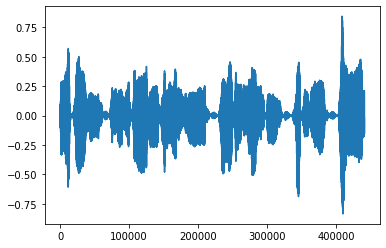

In [16]:
import matplotlib.pyplot as plt
import numpy as np
np.random.seed(42)
left = np.random.randint(wav.shape[0]-441000)
uttr = wav[left:left+441000]
plt.plot(uttr)

In [19]:
import librosa
import os
import numpy as np
import soundfile as sf

np.random.seed(42)
rootDir = './DAMP-multi/input_data'
dirName, subdirList, _ = next(os.walk(rootDir))
for subdir in subdirList:
    _, _, fileList = next(os.walk(os.path.join(dirName,subdir)))
    if not os.path.isdir(os.path.join(dirName,'../processed_data/cropped_input_data/', subdir)):
        os.mkdir(os.path.join(dirName,'../processed_data/cropped_input_data/', subdir))
    for filename in fileList:
        path = os.path.join(dirName, subdir, filename)
        wav, _ = librosa.load(path, sr=44100, mono=True)
        left = np.random.randint(wav.shape[0]-441000)
        uttr = wav[left:left+441000]
        
        sf.write(os.path.join(dirName,f'../processed_data/cropped_input_data/{subdir}/{filename[:-4]}.wav'),uttr,44100)
        break

KeyboardInterrupt: 

In [13]:
dirName

'./DAMP-multi/input_data'

In [27]:
import pandas as pd
df = pd.read_csv('./DAMP-multi/perfs.csv')

5429

In [36]:
df=pd.read_pickle('../autovc/metadata.pkl')

In [44]:
df[0][2].shape

(90, 80)

In [62]:
train.columns

Index(['iteration', 't_loss_id', 't_loss_psnt', 't_loss_cd'], dtype='object')

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go


import numpy as np
train = pd.read_csv('./processed_data/trained_models/logs/train_32x256x512x32.csv', names=['iteration', 't_loss_id', 't_loss_psnt', 't_loss_cd'])
valid = pd.read_csv('./processed_data/trained_models/logs/valid_32x256x512x32.csv', names=['iteration', 'v_loss_id', 'v_loss_psnt', 'v_loss_cd'])

fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=train['iteration'], y=np.log10(train['t_loss_cd']),
                    mode='lines',
                    name='training'))
fig.add_trace(go.Scatter(x=valid['iteration'], y=np.log10(valid['v_loss_cd']),
                    mode='lines',
                    name='validation'))
fig.layout.update(title_text="Log scale training graph")
# fig.add_scatter(x=train['iteration'], y=np.log10(train['t_loss_cd']), mode='lines', name='training')
# fig.add_scatter(x=valid['iteration'], y=np.log10(valid['v_loss_cd']), mode='lines', name='validation')
fig

discussion points - same data, same metrics


In [9]:
fig=go.Figure()
fig.add_scatter(x=train['iteration'], y=train['t_loss_cd'], mode='lines', name='training')
fig.add_scatter(x=valid['iteration'], y=valid['v_loss_cd'], mode='lines', name='validation')

In [23]:
import librosa
import pyworld
import os
import numpy as np
subdirs=[]
filenames=[]
paths=[]
rootDir = './DAMP-multi/processed_data/cropped_input_10s'
dirName, subdirList, _ = next(os.walk(rootDir))
for subdir in subdirList:
    _, _, fileList = next(os.walk(os.path.join(dirName,subdir)))
    for fileName in fileList:
        path = os.path.join(dirName, subdir, fileName)
        filenames.append(fileName)
        subdirs.append(subdir)
        paths.append(path)

In [24]:
import pandas as pd
df=pd.DataFrame()
df['subdir'] = subdirs
df['filename'] = filenames
df['path'] = paths
df

,subdir,filename,path
0,d1005999639,1005999639_990605733.wav,./DAMP-multi/processed_data/cropped_input_10s/...
1,d1005999639,1005999639_1430948660.wav,./DAMP-multi/processed_data/cropped_input_10s/...
2,d1005999639,1005999639_1594908929.wav,./DAMP-multi/processed_data/cropped_input_10s/...
3,d1005999639,1005999639_937335462.wav,./DAMP-multi/processed_data/cropped_input_10s/...
4,d467064613,467064613_782661522.wav,./DAMP-multi/processed_data/cropped_input_10s/...
...,...,...,...
24861,d885696993,885696993_1157577537.wav,./DAMP-multi/processed_data/cropped_input_10s/...
24862,d1293938714,1293938714_1472771268.wav,./DAMP-multi/processed_data/cropped_input_10s/...
24863,d1293938714,1293938714_1466945573.wav,./DAMP-multi/processed_data/cropped_input_10s/...
24864,d1293938714,1293938714_1468762988.wav,./DAMP-multi/processed_data/cropped_input_10s/...
